In [2]:
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = 'retina'

In [3]:
import scanpy as sc 
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import matplotlib.patches as mpatches

In [ ]:
import sys 
sys.path.append('../../src')

from spaceoracle.visionary import Visionary
from spaceoracle.plotting.cartography import xy_from_adata
from spaceoracle.plotting.cartography import Cartography


### Crop/ subsample

In [ ]:
test_adata = sc.read_h5ad('/ix/djishnu/shared/djishnu_kor11/training_data_2025/mouse_kidney_visiumHD.h5ad')
test_adata

In [ ]:
colors = ["#cf713a",
"#8e65c9",
"#5ba85f",
"#c75d9b",
"#6295cd",
"#a6973e",
"#cb5359"]
color_dict = {
    ct: color for ct, color in zip(sorted(test_adata.obs['cell_type'].unique()), colors)
}

color_dict

In [ ]:
# Perturbation keeps running out of memory so subsample / crop an interesting region
fig, ((ax1, ax3, ax5), (ax2, ax4, ax6)) = plt.subplots(2, 3, figsize=(12, 8))

# Get coordinates
spatial_coords = test_adata.obsm['spatial']
umap_coords = test_adata.obsm['X_umap']
cell_colors = [color_dict[ct] for ct in test_adata.obs['cell_type']]

# First column - Full dataset
# Spatial plot with circle
ax1.scatter(
    spatial_coords[:, 0],
    spatial_coords[:, 1],
    c=cell_colors,
    s=3,
    alpha=0.6,
    edgecolors='black',
    linewidth=0.1
)

radius = 3000
center = np.array([22000, 23000])
circle = plt.Circle(center, radius, fill=False, color='red', linestyle='--')
ax1.add_patch(circle)
ax1.set_title(f'Full Dataset - Spatial ({len(test_adata)} cells)')
ax1.set_aspect('equal')

# UMAP plot
ax2.scatter(
    umap_coords[:, 0],
    umap_coords[:, 1], 
    c=cell_colors,
    s=3,
    alpha=0.6,
    edgecolors='black',
    linewidth=0.1
)
ax2.set_title('Full Dataset - UMAP')
ax2.set_aspect('equal')

# Second column - Cropped region
# Get points within circle
distances = np.sqrt(np.sum((spatial_coords - center)**2, axis=1))
mask = distances <= radius

# Plot cropped spatial
ax3.scatter(
    spatial_coords[mask, 0],
    spatial_coords[mask, 1],
    c=[cell_colors[i] for i in range(len(cell_colors)) if mask[i]],
    s=5,
    alpha=0.6,
    edgecolors='black',
    linewidth=0.1
)
ax3.set_title(f'Cropped Region - Spatial ({mask.sum()} cells)')
ax3.set_aspect('equal')

# Plot cropped UMAP
ax4.scatter(
    umap_coords[mask, 0],
    umap_coords[mask, 1],
    c=[cell_colors[i] for i in range(len(cell_colors)) if mask[i]],
    s=5,
    alpha=0.6,
    edgecolors='black',
    linewidth=0.1
)
ax4.set_title('Cropped Region - UMAP')
ax4.set_aspect('equal')

# Third column - Subsampled data
np.random.seed(42)
test_adata_sub = test_adata[np.random.choice(test_adata.obs_names, size=10000, replace=False)].copy()
sub_spatial = test_adata_sub.obsm['spatial']
sub_umap = test_adata_sub.obsm['X_umap']
sub_colors = [color_dict[ct] for ct in test_adata_sub.obs['cell_type']]

# Plot subsampled spatial
ax5.scatter(
    sub_spatial[:, 0],
    sub_spatial[:, 1],
    c=sub_colors,
    s=5,
    alpha=0.6,
    edgecolors='black',
    linewidth=0.1
)
ax5.set_title(f'Subsampled - Spatial ({len(test_adata_sub)} cells)')
ax5.set_aspect('equal')

# Plot subsampled UMAP
ax6.scatter(
    sub_umap[:, 0],
    sub_umap[:, 1],
    c=sub_colors,
    s=5,
    alpha=0.6,
    edgecolors='black',
    linewidth=0.1
)
ax6.set_title('Subsampled - UMAP')
ax6.set_aspect('equal')

# Add legend
patches = [mpatches.Patch(color=color, label=ct) 
           for ct, color in color_dict.items()]
fig.legend(handles=patches, 
          bbox_to_anchor=(1.05, 0.5),
          loc='center left',
          title='Cell Types')

plt.tight_layout()
plt.show()

In [ ]:
ref_adata.X.min(), ref_adata.X.max()

In [ ]:
test_adata.X.min(), test_adata.X.max()

In [48]:
adata_concat = ref_adata.concatenate(test_adata)
adata_concat.obs['batch'] = ['ref' if i < len(ref_adata) else 'test' for i in range(len(adata_concat))]
# adata_concat.X = adata_concat.layers['normalized_count']
sc.pp.combat(adata_concat, key='batch')

In [ ]:
adata_concat.X.min(), adata_concat.X.max()

In [ ]:
adata_concat.X = np.where(adata_concat.X < 0, 0, adata_concat.X)
sc.pp.log1p(adata_concat)
adata_concat.X.min(), adata_concat.X.max()

In [ ]:
test_adata.layers['imputed_count'] = adata_concat[test_adata.obs.index + '-1', test_adata.var.index].X
test_adata.write_h5ad('/ix/djishnu/shared/djishnu_kor11/training_data_2025/mouse_kidney_visiumHD_subsampled.h5ad')


In [ ]:
# from spaceoracle.oracles import BaseTravLR

# test_adata = test_adata[mask, :]
# pcs = BaseTravLR.perform_PCA(test_adata)
# BaseTravLR.knn_imputation(test_adata, pcs, method='MAGIC')

# test_adata.write_h5ad('/ix/djishnu/shared/djishnu_kor11/training_data_2025/mouse_kidney_visiumHD_cropped.h5ad')

In [ ]:
# from spaceoracle.oracles import BaseTravLR

# test_adata = test_adata_sub
# pcs = BaseTravLR.perform_PCA(test_adata)
# BaseTravLR.knn_imputation(test_adata, pcs, method='MAGIC')

# test_adata.write_h5ad('/ix/djishnu/shared/djishnu_kor11/training_data_2025/mouse_kidney_visiumHD_subsampled.h5ad')

### Set up visionary

In [5]:
test_adata = sc.read_h5ad('/ix/djishnu/shared/djishnu_kor11/training_data_2025/mouse_kidney_visiumHD_subsampled.h5ad')
ref_adata = sc.read_h5ad('/ix/djishnu/shared/djishnu_kor11/training_data_2025/mouse_kidney_13.h5ad')
ref_models_dir = '/ix/djishnu/shared/djishnu_kor11/lasso_runs/mouse_kidney_13'

ref_adata, test_adata

(AnnData object with n_obs × n_vars = 8509 × 3058
     obs: 'ct1', 'ct2', 'ct3', 'ct4', 'cond', 'medulla_cortex', 'domain', 'cell_type', 'cell_type_int'
     uns: 'cell_thresholds', 'cell_type_colors', 'neighbors', 'pca', 'received_ligands', 'received_ligands_tfl', 'umap'
     obsm: 'X_pca', 'X_umap', 'spatial', 'spatial_unscaled'
     varm: 'PCs'
     layers: 'imputed_count', 'normalized_count', 'raw_count'
     obsp: 'connectivities', 'distances',
 AnnData object with n_obs × n_vars = 10000 × 3058
     obs: 'ct3', 'cell_type', 'x', 'y', 'banksy_cluster', 'x_umap', 'y_umap'
     obsm: 'X_harmony', 'X_pca', 'X_umap', 'spatial'
     layers: 'imputed_count', 'normalized_count', 'raw_count')

In [6]:
harmony_df = pd.read_csv('banksy_subsampled_harmony.csv', index_col=0)

ref_adata.obsm['X_harmony'] = harmony_df.loc[ref_adata.obs.index + '-0', :].values
test_adata.obsm['X_harmony'] = harmony_df.loc[test_adata.obs.index + '-1', :].values

# ref_adata.obsm['X_umap'] = ref_adata.obsm['X_harmony'][:, :2]
# test_adata.obsm['X_umap'] = test_adata.obsm['X_harmony'][:, :2]


In [7]:
# matching = pd.read_csv('matching_slat.csv', index_col=0)
matching = pd.read_csv('matching_slat_banksy_subsampled.csv', index_col=0)
matching.head(3)

,reference_cell
ID_167606,AGTACTGTCACTTATC-13
ID_103875,CTACCCACAGACGGAT-13
ID_276156,CAACAGTCATAACTCG-13


In [8]:
banksy_df = pd.read_csv('banksy_subsampled.csv', index_col=0)
banksy_df.head(3)

,ct3,cell_type,x,y,banksy_cluster,x_umap,y_umap
ID_167606,Mac_4,Myeloid,20646.342233,13577.402528,11,4.125597,10.845884
ID_103875,Epithelial_TALH_0,Epithelial,15934.699117,8659.666685,8,11.540658,13.369151
ID_276156,Perictye,Mesenchymal_Stromal,26279.892415,19862.586445,5,4.744831,7.484254


In [9]:
import warnings
warnings.simplefilter("ignore", category=UserWarning)


renata = Visionary(
    ref_adata = ref_adata,
    test_adata = test_adata,
    ref_json_path = f'{ref_models_dir}/run_params.json',
    subsample=1,
    prematching=matching,
    matching_annot='cell_type'
)

### Perturb

In [10]:
target = 'Mif' 
# target = 'Tfap2b'
# target = 'Ccr2'
# target = 'Pax5'
gex = 0

In [11]:
# renata.perturb(target, n_propagation=4, save_layer=True)
# gex_df = renata.adata.to_df(layer=f'{target}_4n_{gex}x')
# gex_df.to_parquet(f'/ix/djishnu/shared/djishnu_kor11/genome_screens/mouse_kidney_visiumHD_subsampled/{target}_4n_{gex}x.parquet')

In [12]:
adata = renata.adata
gf = renata

In [13]:
gex_df = pd.read_parquet(f'/ix/djishnu/shared/djishnu_kor11/genome_screens/mouse_kidney_visiumHD_subsampled/{target}_4n_{gex}x.parquet')
adata.layers[target] = gex_df.loc[adata.obs.index, adata.var.index].values
adata.to_df(layer=f'{target}')[target].max() # make sure it's been knocked out

0.0

In [14]:
colors =[
    "#6f6ec7",
    "#59ba58",
    "#a45dcf",
    "#a2b343",
    "#c857a7",
    "#4e884c",
    "#d44064",
    "#50bca8",
    "#c65d3d",
    "#6b96d2",
    "#d49a46",
    "#bd6c8a",
    "#817531"
]
color_dict = {i: color for i, color in zip(adata.obs['banksy_cluster'].unique(), colors)}

In [15]:
adata.obs['ct3'] = adata.obs['reference_cell'].map(ref_adata.obs['ct3'])
adata.obs['cell_type'] = adata.obs['reference_cell'].map(ref_adata.obs['cell_type'])

In [16]:
target_gene = 'Mif'
chart = Cartography(adata, color_dict)

### Spatial betas

In [14]:
def get_relevant_genes(target_gene, gf, adata):
    # betadata = gf.load_betadata(gene=target_gene, save_dir=gf.save_dir)
    xy = pd.DataFrame(adata.obsm['spatial'], columns=['x', 'y'], index=adata.obs_names)
    df = xy.join(adata.obs).join(adata.to_df(layer='imputed_count'))
    df = df[df.x > 500]
    splat = gf.splash_betas(target_gene)
    # bdf = splat.join(xy).join(adata.obs)
    out = splat.mean().sort_values(ascending=False, key=abs).head(20).to_frame()
    out.columns = [target_gene]
    return out

In [15]:
colors = ["#9ac54f",
"#8146b8",
"#87b997",
"#c45183",
"#4c3c3a",
"#c46f41",
"#8d93c1"]

color_dict = {
    ct: color for ct, color in zip(adata.obs['cell_type'].unique(), colors)
}

In [ ]:
xy = pd.DataFrame(adata.obsm['spatial'], columns=['x', 'y'], index=adata.obs_names)
df = xy.join(adata.obs).join(adata.to_df(layer='imputed_count'))

splat = gf.splash_betas(target_gene)
bdf = splat.join(xy).join(adata.obs)

df_ = bdf[bdf['ref_ct3'].isin(['Mac_0', 'Mac_2'])]

top_betas = splat.mean().sort_values(ascending=False, key=abs).head(12)
top_betas

In [ ]:
sample = 'mouse_kidney_visiumHD_whole'
ref_order = [
    'beta_Tfcp2l1', 'beta_Mbd1', 'beta_Gata3', 'beta_Pax2', 'beta_Sp4', 'beta_Id4', 
    'beta_Sim2', 'beta_Klf5', 'beta_Tead1', 'beta_Jdp2', 'beta_Bhlhe40', 'beta_Sim1'
]

cbar_range = {
    'beta_Tfcp2l1': (0.3, 0.58),
    'beta_Mbd1': (0.26, 0.41),
    'beta_Gata3': (0.09, 0.31),
    'beta_Pax2': (0.27, 0.33),
    'beta_Sp4': (-0.57, -0.25),
    'beta_Id4': (-0.23, -0.04),
    'beta_Sim2': (0.05, 0.22),
    'beta_Klf5': (-0.26, -0.05),
    'beta_Tead1': (0.04, 0.32),
    'beta_Jdp2': (-0.11, -0.05),
    'beta_Bhlhe40': (0.13, 0.23),
    'beta_Sim1': (0.01, 0.3),
}

fig, axes = plt.subplots(4, 3, figsize=(25, 19), dpi=200)
axes = axes.flatten()

for i, target in enumerate(ref_order):
    ax = axes[i]
    
    ax.scatter(
        df['x'], df['y'],
        c='grey',
        alpha=0.3,
        s=20, marker='o',
        cmap='rainbow',
        linewidth=0.0, edgecolor='black'
    )

    markers = {'Mac_0': 'X', 'Mac_2': 'o'}
    for cell_type in markers:
        mask = df_['ref_ct3'] == cell_type
        scatter = ax.scatter(
            df_[mask]['x'], df_[mask]['y'],
            c=df_[mask][target],
            s=40, marker=markers[cell_type],
            cmap='rainbow', linewidth=0.35, edgecolor='black',
            vmin=cbar_range[target][0], vmax=cbar_range[target][1]
        )
    
    ax.set_axis_off()
    ax.set_aspect('equal')    
    cbar = plt.colorbar(scatter, ax=ax, shrink=0.6)
    # cbar.set_label(target, fontsize=12)
    ax.set_title(f'{target.replace("beta_", "")}', fontsize=20)

plt.suptitle(f'{sample} Beta Coefficients for {target_gene}\n\n', fontsize=30)
plt.tight_layout()
plt.show()

In [ ]:
not_banksy = pd.read_csv('matching_slat_subsampled.csv', index_col=0)
not_banksy['not_banksy_ct'] = not_banksy['reference_cell'].map(ref_adata.obs['cell_type'])
df = pd.concat([matching, not_banksy], axis=1)
df = pd.concat([df, adata.obs], axis=1)
df[df['not_banksy_ct'] != df['ref_cell_type']]

In [ ]:

import plotly.graph_objects as go
from collections import defaultdict

# Count transitions between cell types
source_target_counts = defaultdict(int)
for _, row in df.iterrows():
    source_target_counts[(row['not_banksy_ct'], row['ref_cell_type'])] += 1

# Create lists for Sankey diagram
source_labels = list(set(df['not_banksy_ct'].unique()))
target_labels = list(set(df['ref_cell_type'].unique()))
all_labels = source_labels + target_labels

# Create source/target indices and values
sources = []
targets = []
values = []

for (source, target), count in source_target_counts.items():
    sources.append(source_labels.index(source))
    targets.append(len(source_labels) + target_labels.index(target))
    values.append(count)

# Create and show Sankey diagram
fig = go.Figure(data=[go.Sankey(
    node = dict(
        pad = 15,
        thickness = 20,
        line = dict(color = "black", width = 0.5),
        label = all_labels,
    ),
    link = dict(
        source = sources,
        target = targets,
        value = values
    )
)])

fig.update_layout(title_text="Cell Type Transitions", font_size=10)
fig.show()


### Transitions

In [17]:
adata.obs = adata.obs.drop(columns=['x', 'y'])

In [18]:
# umap_coords = pd.read_csv('banksy_subsampled.csv', index_col=0)
# umap_coords = umap_coords.loc[adata.obs.index, ['x_umap', 'y_umap']].values

# adata.obsm['X_umap'] = umap_coords

In [19]:
# sample = 'mouse_kidney_visiumHD_subsampled_banksy'

# kotarget = 'Mif'
# ax = chart.plot_umap_quiver(
#     perturb_target=kotarget,
#     grid_scale=1,
#     vector_scale=0.5,
#     figsize=(5, 5), 
#     # hue='ref_cell_type',
#     hue='banksy_cluster',
#     alpha=0.5,
#     scatter_size=10,
#     # betadata_path=f'/ix/djishnu/shared/djishnu_kor11/genome_screens/{sample}/not_batch_corrected',
#     betadata_path=f'/ix/djishnu/shared/djishnu_kor11/genome_screens/{sample}',
#     legend_on_loc=False,
# )
# ax.legend(
#     bbox_to_anchor=(0.5, 0.0),
#     loc='upper center', ncol=3, 
#     frameon=False, markerscale=1.5,
#     fontsize=6
# )

# # Add cluster labels on top of points
# for cluster in adata.obs['banksy_cluster'].unique():
#     mask = adata.obs['banksy_cluster'] == cluster
#     x = adata.obsm['X_umap'][mask, 0].mean()
#     y = adata.obsm['X_umap'][mask, 1].mean()
#     ax.text(x, y, str(cluster),
#             horizontalalignment='center',
#             verticalalignment='center',
#             fontsize=8,
#             bbox=dict(facecolor='gray', alpha=0.2, edgecolor='none'))

# plt.title(f'{kotarget} KO')
# plt.show()

In [20]:
# adata_ = adata[adata.obs['cell_type'].isin(['Epithelial', 'Mesenchymal_Stromal'])].copy()
# adata_ = adata[adata.obs['ct3'].isin([x for x in adata.obs['ct3'].unique() if ('Intercalated' in str(x) or 'Principal_Cells' in str(x))])].copy()
# adata_ = adata[adata.obs['ref_ct3'].isin(['Mac_0', 'Mac_2'])].copy()
adata_ = adata[adata.obs['ct3'].str.contains('Mac')]
# adata_ = adata[adata.obs['cell_type'].isin(['Myeloid'])].copy()
sorted(adata_.obs['ct3'].unique())

['Mac_0',
 'Mac_1_CellCycle+_0',
 'Mac_1_CellCycle+_1',
 'Mac_2',
 'Mac_3_TGFB3+',
 'Mac_4']

In [18]:
# import itertools

# sc.pp.neighbors(adata_, use_rep='X_pca')
# sc.tl.leiden(adata_, key_added='leiden', resolution=1.6)

# color_dict = {i: color for i, color in zip(adata_.obs['leiden'].unique(), itertools.cycle(colors))}
# # color_dict = {'1': '#626fc5',
# #  '0': '#b6b434',
# #  '2': '#a058c7',
# #  '3': '#5bb84d',
# #  '4': '#d050a6',
# #  '5': '#38824d',
# #  '6': '#d53e67',
# # }

# for ct in adata_.obs['leiden'].unique():
#     mask = adata_.obs['leiden'] == ct
#     plt.scatter(
#         adata_.obsm['spatial'][mask, 0], adata_.obsm['spatial'][mask, 1],
#         c=color_dict[ct], s=10, alpha=0.5, label=ct,
#         edgecolor='black', linewidth=0.1
#     )
# plt.gca().set_axis_off()
# plt.gca().set_aspect('equal')
# plt.legend()

# plt.show()

In [19]:
# marker_dict = {
#     'Mac': ['Adgre1', 'Fcgr1', 'Mertk', 'Fcgr4', 'Cd68', 'Cd14'],
#     'M1-like': ['Tnf', 'Ccl2', 'Cd86', 'Cd80', 'Il1r1', 'Il1r2', 'Nos2', 'Il6', 'Il1b'],
#     'M2-like': ['Arg1', 'Mrc1', 'Msr1', 'Fcer2a', 'Retnla', 'Chi3l3', 'Il10', 'Tgfb1', 'Cd163']
# }

# marker_dict = {k: [x for x in v if x in adata.var_names] for k,v in marker_dict.items()}
# sc.pl.dotplot(
#     adata_,
#     marker_dict,
#     # layer='imputed_count',   
#     layer='normalized_count',  
#     # groupby='banksy_cluster',
#     # groupby='ct3',
#     groupby='leiden', 
#     dendrogram=False,
#     standard_scale='var',
#     figsize=(10, 4), 
#     # title='Macrophage Markers in mouse_kidney_13',
# )


In [20]:
# # adata_ = adata_[~adata_.obs['leiden'].isin(['1', '7', '5'])]
# adata_ = adata_[adata_.obs['leiden'].isin(['7'])  ]
# adata_

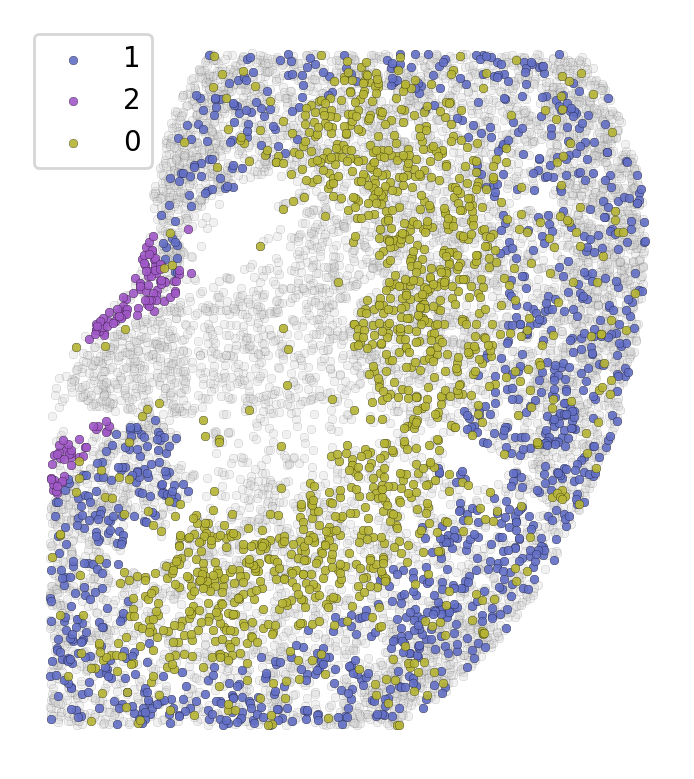

In [21]:
# sc.pp.neighbors(adata_, use_rep='X_umap')
sc.pp.neighbors(adata_, use_rep='X_pca')
sc.tl.leiden(adata_, key_added='leiden', resolution=0.1)

# color_dict = {i: color for i, color in zip(adata_.obs['leiden'].unique(), colors)}
color_dict = {
    'null': '#ffffff',
    '1': '#626fc5',
    '0': '#b6b434',
    '2': '#a058c7',
    '3': '#5bb84d',
    '4': '#d050a6'}

plt.scatter(
    adata.obsm['spatial'][:, 0], adata.obsm['spatial'][:, 1],
    c='lightgray', s=10, alpha=0.3,
    edgecolor='black', linewidth=0.1
)
for ct in adata_.obs['leiden'].unique():
    mask = adata_.obs['leiden'] == ct
    plt.scatter(
        adata_.obsm['spatial'][mask, 0], adata_.obsm['spatial'][mask, 1],
        c=color_dict[ct], s=10, alpha=0.9, label=ct,
        edgecolor='black', linewidth=0.1
    )
plt.gca().set_axis_off()
plt.gca().set_aspect('equal')
plt.legend()

plt.show()

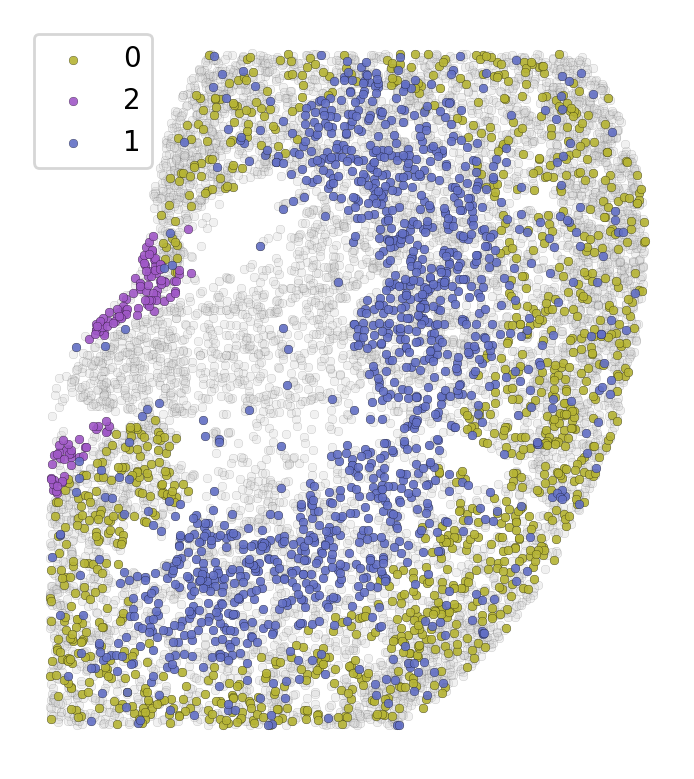

In [22]:
# change 0 and 1 clusters so that green is on the outside

adata_.obs['leiden_v2'] = adata_.obs['leiden'].copy()
adata_.obs['leiden'] = adata_.obs['leiden'] = adata_.obs['leiden'].map(lambda x: '1' if x == '0' else ('0' if x == '1' else x))

plt.scatter(
    adata.obsm['spatial'][:, 0], adata.obsm['spatial'][:, 1],
    c='lightgray', s=10, alpha=0.3,
    edgecolor='black', linewidth=0.1
)
for ct in adata_.obs['leiden'].unique():
    mask = adata_.obs['leiden'] == ct
    plt.scatter(
        adata_.obsm['spatial'][mask, 0], adata_.obsm['spatial'][mask, 1],
        c=color_dict[ct], s=10, alpha=0.9, label=ct,
        edgecolor='black', linewidth=0.1
    )
plt.gca().set_axis_off()
plt.gca().set_aspect('equal')
plt.legend()

plt.show()


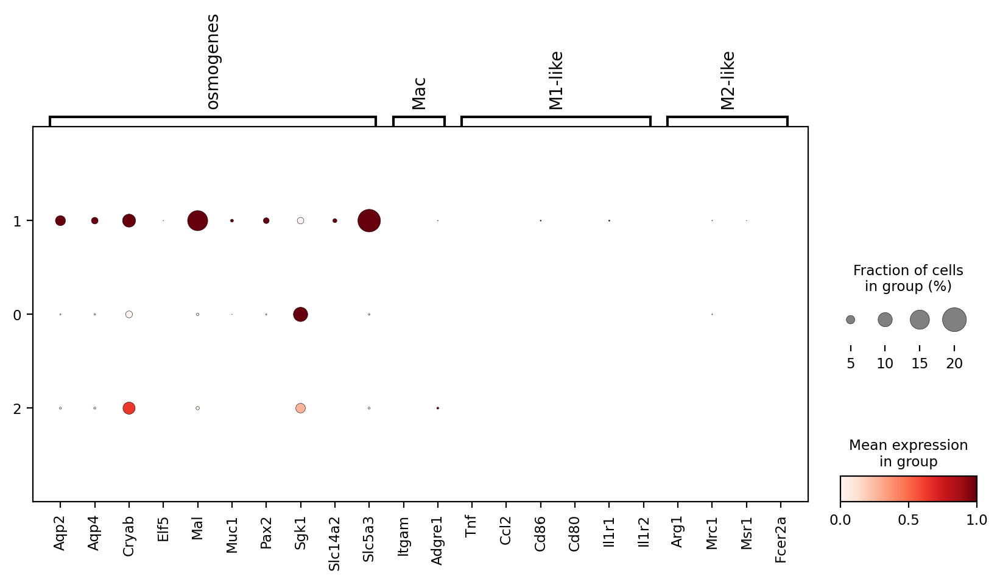

In [23]:
marker_dict = {
    'osmogenes': ['Aqp2', 'Aqp4', 'Cryab', 'Elf5', 'Mal', 'Muc1',
        'Pax2', 'Sgk1', 'Slc14a2', 'Slc5a3'],
    'Mac': ['Itgam', 'Adgre1'],
    'M1-like': ["Tnf", 'Ccl2', 'Cd86', 'Cd80', 'Il1r1', 'Il1r2'],
    'M2-like': ['Arg1', 'Mrc1', 'Msr1', 'Fcer2a']
}


marker_dict = {k: [x for x in v if x in adata.var_names] for k,v in marker_dict.items()}
sc.pl.dotplot(
    adata_,
    marker_dict,
    # layer='imputed_count', 
    layer='normalized_count',  
    # groupby='banksy_cluster',
    # groupby='ct3',
    groupby='leiden', 
    dendrogram=False,
    standard_scale='var',
    figsize=(10, 4), 
    # title='Macrophage Markers in mouse_kidney_13',
)


In [24]:
# adata_.obs['banksy_cluster'] = adata_.obs['banksy_cluster'].astype(int)

chart_ = Cartography(adata_, color_dict)


In [23]:
# adata_.obs = adata_.obs.drop(columns=['x', 'y'])

In [ ]:
# adata_.X = adata_.layers['normalized_count']

# # Score each gene set
# for name, genes in marker_dict.items():
#     sc.tl.score_genes(adata_, gene_list=genes, score_name=name + '_score')

# # Plot each score spatially
# for name in marker_dict:
#     score_col = name + '_score'
#     plt.figure(figsize=(6, 6))
#     plt.scatter(
#         adata_.obsm['X_umap'][:, 0],
#         adata_.obsm['X_umap'][:, 1],
#         c=adata_.obs[score_col],
#         cmap='viridis',  # You can change colormap here
#         s=10, alpha=0.9,
#         edgecolor='none'
#     )
#     plt.title(f'{name} score')
#     plt.gca().set_axis_off()
#     plt.gca().set_aspect('equal')
#     plt.colorbar(label='Score')
#     plt.show()


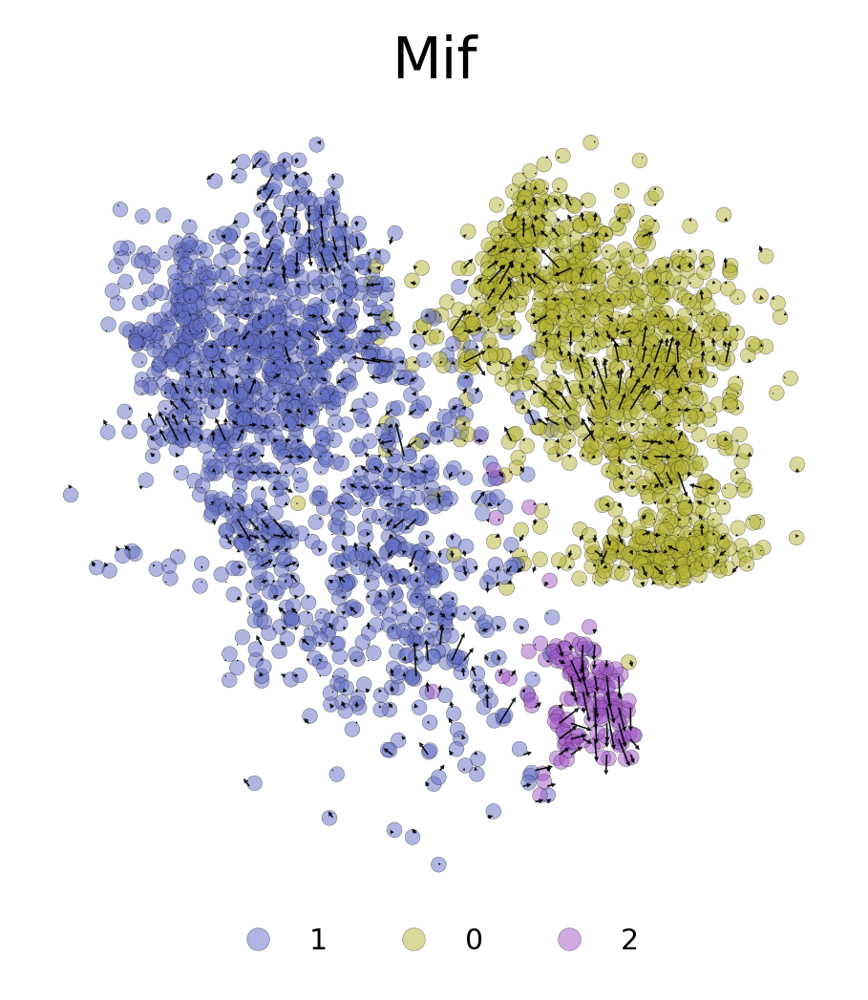

In [78]:
##  This quiver plot is kinda ugly. Trying something else

# sample = 'mouse_kidney_visiumHD_subsampled_banksy'

# kotarget = 'Mif'
# ax = chart_.plot_umap_quiver(
#     perturb_target=kotarget,
#     grid_scale=1.5,
#     vector_scale=0.5,
#     figsize=(3, 3), 
#     # hue='ref_ct3', 
#     # hue='banksy_cluster',
#     hue='leiden',
#     alpha=0.5,
#     scatter_size=10,
#     betadata_path=f'/ix/djishnu/shared/djishnu_kor11/genome_screens/{sample}', 
#     # betadata_path=f'/ix/djishnu/shared/djishnu_kor11/genome_screens/{sample}/not_batch_corrected',
#     legend_on_loc=False,
# )
# # Add legend at bottom
# ax.legend(
#     bbox_to_anchor=(0.5, 0.0),
#     loc='upper center', ncol=3, 
#     frameon=False, markerscale=1.5,
#     fontsize=6
# )

# # plt.title(f'{sample} {kotarget} Perturbation (Macs only)')
# plt.show()

In [25]:
chart_.adata

AnnData object with n_obs × n_vars = 2552 × 3058
    obs: 'ct3', 'cell_type', 'banksy_cluster', 'x_umap', 'y_umap', 'cell_type_int', 'reference_cell', 'leiden', 'leiden_v2'
    uns: 'cell_thresholds', 'neighbors', 'leiden'
    obsm: 'X_harmony', 'X_pca', 'X_umap', 'spatial'
    layers: 'imputed_count', 'normalized_count', 'raw_count', 'Mif'
    obsp: 'distances', 'connectivities'

In [26]:
delta_X = (chart_.adata.to_df(layer='Mif') - chart_.unperturbed_expression).values
gene_mtx = chart_.unperturbed_expression.values
gene_mtx.shape, delta_X.shape

((2552, 3058), (2552, 3058))

In [27]:
corr = chart_.compute_perturbation_corr(gene_mtx, delta_X)
corr.shape

(2552, 2552)

In [28]:
source_ct = '0'
transition_df0 = chart_.compute_transitions(corr, source_ct=source_ct, annot='leiden')
chart_.assess_transitions(
    transition_df0, adata_.obs['leiden'], source_ct, 'leiden')

Source Cells: 0,min,mean,max
Transition Target,,,
0,0.000499,0.000764,0.000845
1,0.000046,0.000112,0.000336
2,0.000023,0.000054,0.000489


In [53]:
transition_df0.values.flatten().mean()

0.0003918495297805646

In [47]:
ix = 0
base_celltypes = chart_.adata.obs['leiden']
fate_df = transition_df0.iloc[ix].to_frame().join(
                base_celltypes).groupby('leiden').mean().loc[['0', '1', '2']]
fate_df

,0
leiden,
0,0.000757
1,0.000117
2,0.000063


In [26]:
print(f'source{source_ct} transitions')
fates0 = chart_.get_cellfate(transition_df0, 
                    allowed_fates=adata_.obs['leiden'].unique(), thresh=0.0002, annot='leiden')

source0 transitions
Counter({'0': 1107}) 0.0006909756591180848


In [27]:
source_ct = '1'

transition_df1 = chart_.compute_transitions(corr, source_ct=source_ct, annot='leiden')
assess_df = chart_.assess_transitions(
    transition_df1, adata_.obs['leiden'], source_ct, 'leiden')
assess_df

Source Cells: 1,min,mean,max
Transition Target,,,
1,0.000125,0.000429,0.000602
0,0.000186,0.000384,0.000749
2,0.000040,0.000091,0.000304


In [28]:
print(f'source{source_ct} transitions')
fates1 = chart_.get_cellfate(transition_df1, 
                    allowed_fates=adata_.obs['leiden'].unique(), thresh=0.0002, annot='leiden')

source1 transitions
Counter({'1': 765, '0': 545}) 0.0005079883783364848


In [29]:
# from numba import jit

# # Cannibalized from CellOracle
# @jit(nopython=True)
# def permute_rows_nsign(A: np.ndarray) -> None:
#     """Permute in place the entries and randomly switch the sign for each row of a matrix independently.
#     """
#     plmi = np.array([+1, -1])
#     for i in range(A.shape[0]):
#         np.random.shuffle(A[i, :])
#         A[i, :] = A[i, :] * np.random.choice(plmi, size=A.shape[1])


In [87]:
# rand_corr = corr.copy()
# permute_rows_nsign(rand_corr)

# source_ct = '0'
# print(f'randomly permuted source {source_ct} transitions')
# transition_df = chart_.compute_transitions(rand_corr, source_ct=source_ct, annot='leiden')
# chart_.assess_transitions(
#     transition_df, adata_.obs['leiden'], source_ct, 'leiden')
# chart_.get_cellfate(transition_df, 
#                     allowed_fates=adata_.obs['leiden'].unique(), thresh=0.0002, annot='leiden')
# print('\n')
# source_ct = '1'
# print(f'randomly permuted source{source_ct} transitions')
# transition_df = chart_.compute_transitions(rand_corr, source_ct=source_ct, annot='leiden')
# chart_.assess_transitions(
#     transition_df, adata_.obs['leiden'], source_ct, 'leiden')
# chart_.get_cellfate(transition_df, 
#                     allowed_fates=adata_.obs['leiden'].unique(), thresh=0.0002, annot='leiden')


randomly permuted source 0 transitions
Counter({'1': 437, '0': 425, '2': 245}) 0.0009021546336441152


randomly permuted source1 transitions
Counter({'1': 537, '0': 487, '2': 286}) 0.0007619659884286345


### Plot final

In [28]:
import alphashape
from matplotlib.legend_handler import HandlerTuple
import matplotlib
import seaborn as sns 
from shapely.geometry import Point

In [29]:
adata = adata_
chart = chart_

In [31]:
# T = 0.05
# P = np.ones((adata.n_obs, adata.n_obs))
# np.fill_diagonal(P, 0)
# P *= np.exp(corr / T)   
# P /= P.sum(1)[:, None]

In [32]:
# transition_df = pd.DataFrame(P)
# transition_df.columns = adata.obs_names

In [33]:
# transitions = chart.get_cellfate(transition_df, allowed_fates=['0', '1', '2'], thresh=0.0002, annot='leiden')
# adata.obs['transition'] = transitions

In [31]:
chart.get_transition_annot(
    corr, allowed_fates=['0', '1', '2'], thresh=0, annot='leiden')
adata.obs['transition'] = chart.adata.obs['transition']

0
source ct 0 Counter({'0': 1107}) 0.0006909756591180848
0
source ct 2 Counter({'2': 94, '0': 41}) 0.0008556779807071426
0
source ct 1 Counter({'1': 765, '0': 545}) 0.0005079883783364848


In [35]:
# chart.color_dict['null'] = '#e3e3e3'

In [32]:
xy = pd.DataFrame(adata.obsm['spatial'], index=adata.obs.index, columns=['x', 'y'])

In [33]:
ct_points_wt, ct_points_ko = chart.make_celltype_dict(annot='leiden')
ct_points_wt, ct_points_ko

({'0': array([[20616.34223347, 13607.40252783],
         [26249.89241485, 19892.58644513],
         [22634.22712926, 12908.60157712],
         ...,
         [22375.95362286,  8446.15216405],
         [20533.68476293, 26585.52671361],
         [26172.23824796, 21733.7994874 ]]),
  '2': array([[ 6266.25605597, 16679.89224815],
         [ 8755.24053999, 18460.10434099],
         [ 4974.2120089 , 12028.50457682],
         ...,
         [ 5857.98526186, 12010.01419914],
         [ 5133.50605179, 12617.26350443],
         [ 8138.02773142, 17691.38255802]]),
  '1': array([[17072.04346967, 18347.1976119 ],
         [12430.4090504 , 23038.49017393],
         [14770.42435509, 22399.05982165],
         ...,
         [10298.17739332, 12748.95981885],
         [17222.757516  ,  3854.3670695 ],
         [19025.83942019, 18354.63034034]])},
 {'0': array([[20616.34223347, 13607.40252783],
         [26249.89241485, 19892.58644513],
         [22634.22712926, 12908.60157712],
         ...,
         [2237

In [34]:
ref_adata.obs['x'] = ref_adata.obsm['spatial'][:, 0]
ref_adata.obs['y'] = ref_adata.obsm['spatial'][:, 1]

In [35]:
source_cells = adata.obs.index

In [36]:
alpha_shape_0 = alphashape.alphashape(ct_points_wt['0'], alpha=0.002)
alpha_shape_1 = alphashape.alphashape(ct_points_wt['1'], alpha=0.002)
alpha_shape_2 = alphashape.alphashape(ct_points_wt['2'], alpha=0.002)

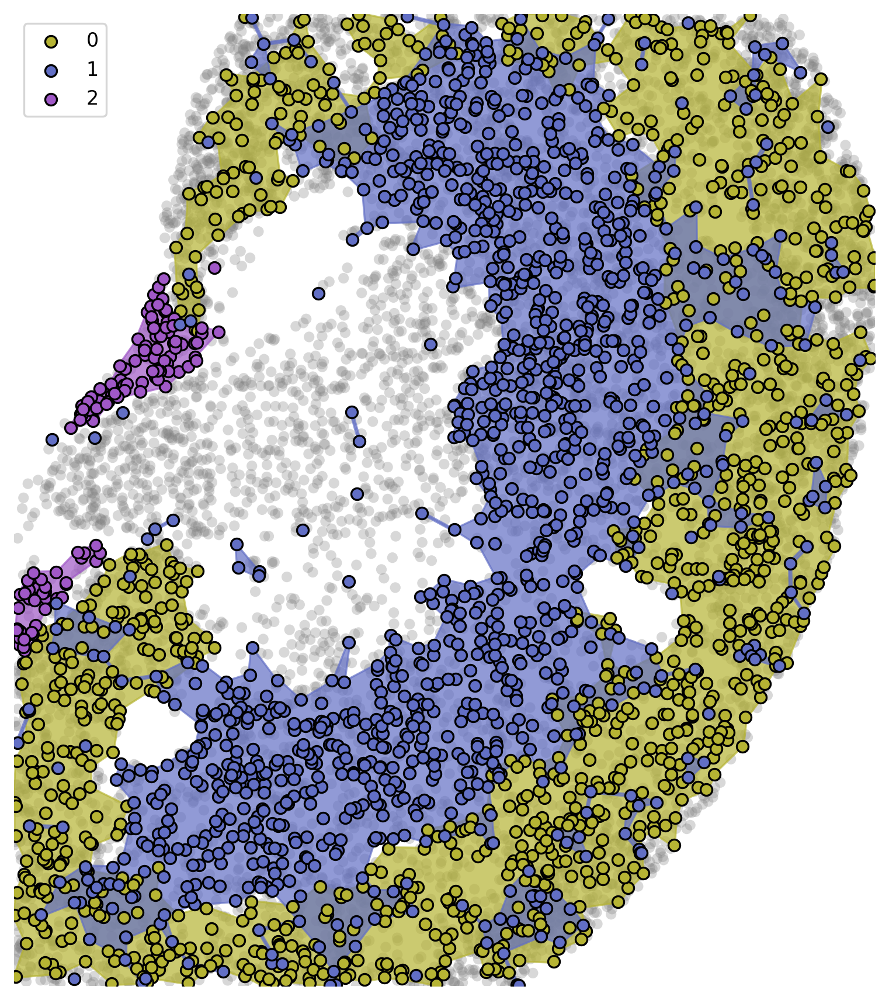

In [37]:
fig, ax = plt.subplots(figsize=(20, 9), dpi=120)
data = xy.join(adata.obs)

scatter = sns.scatterplot(
    # data=xy.join(adata.obs),
    data = test_adata.obs,
    x='x', y='y',
    # hue='banksy_celltypes', 
    color='grey',
    s=30,
    alpha=0.3,
    edgecolor='none',
    # palette=color_dict,
    ax=ax,
)

zone_alpha = 0.7
area_thresh = 400

for geom in alpha_shape_0.geoms:
    if geom.area > area_thresh:
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=color_dict['0'], alpha=zone_alpha)

for geom in alpha_shape_1.geoms:
    if geom.area > area_thresh:
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=color_dict['1'], alpha=zone_alpha)
        
for geom in alpha_shape_2.geoms:
    if geom.area > area_thresh:
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=color_dict['2'], alpha=zone_alpha)

for ct in adata.obs['leiden'].unique():
    ax.scatter(
        adata[adata.obs['leiden'] == ct].obsm['spatial'][:, 0],
        adata[adata.obs['leiden'] == ct].obsm['spatial'][:, 1],
        c=color_dict[ct], alpha=1, edgecolor='black', linewidth=1, label=ct
    )

handles, labels = ax.get_legend_handles_labels()
sorted_handles_labels = sorted(zip(handles, labels), key=lambda x: int(x[1]))
sorted_handles, sorted_labels = zip(*sorted_handles_labels)
ax.legend(sorted_handles, sorted_labels)

ax.set_frame_on(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_xlim(data.x.min() - 10, data.x.max() + 10)
ax.set_ylim(data.y.min() - 10, data.y.max() + 10)

plt.savefig(f'figures/mouse_kidney_visium_MifKO_preKO.svg', format='svg')

In [38]:
alpha_shape_0 = alphashape.alphashape(ct_points_ko['0'], alpha=0.002)
alpha_shape_1 = alphashape.alphashape(ct_points_ko['1'], alpha=0.002)
alpha_shape_2 = alphashape.alphashape(ct_points_ko['2'], alpha=0.002)

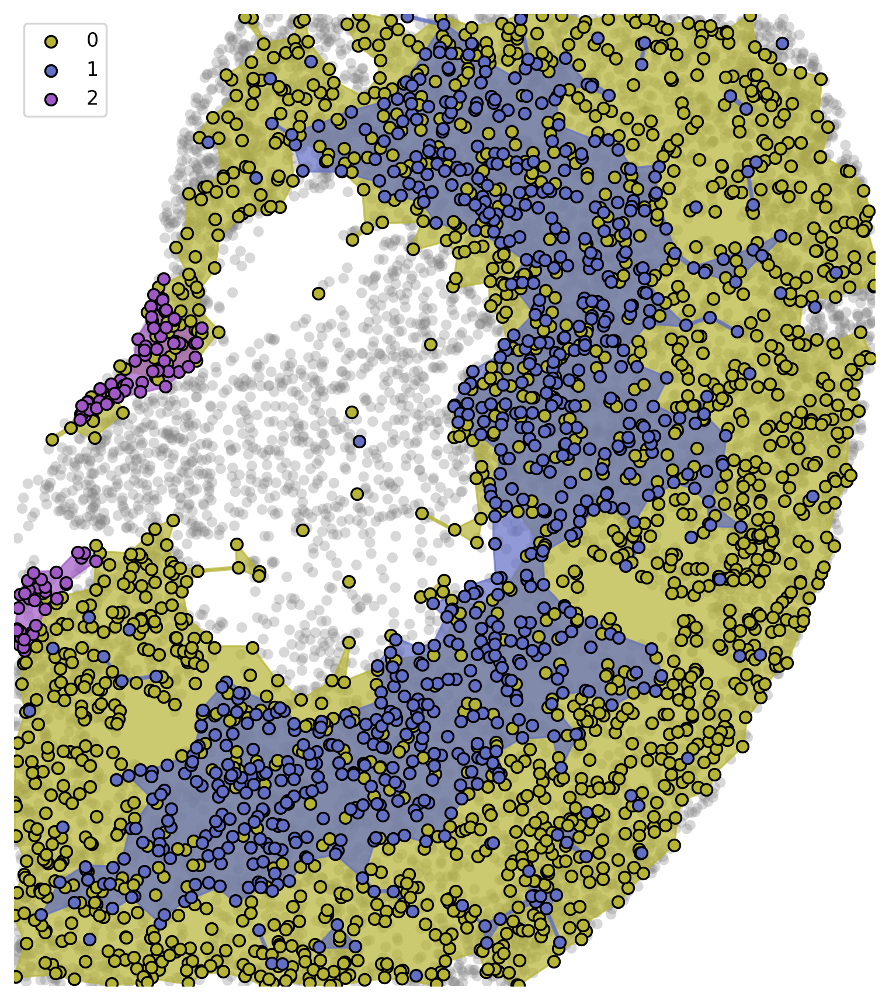

In [40]:
fig, ax = plt.subplots(figsize=(20, 9), dpi=120)
data = xy.join(adata.obs)

scatter = sns.scatterplot(
    # data=xy.join(adata.obs),
    data = test_adata.obs,
    x='x', y='y',
    # hue='banksy_celltypes', 
    color='grey',
    s=30,
    alpha=0.3,
    edgecolor='none',
    # palette=color_dict,
    ax=ax,
)

zone_alpha = 0.7
area_thresh = 400

for geom in alpha_shape_0.geoms:
    if geom.area > area_thresh:
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=color_dict['0'], alpha=zone_alpha)
    

for geom in alpha_shape_1.geoms:
    if geom.area > area_thresh:
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=color_dict['1'], alpha=zone_alpha)
        
    
for geom in alpha_shape_2.geoms:
    if geom.area > area_thresh:
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=color_dict['2'], alpha=zone_alpha)

for ct in adata.obs['transition'].unique():
    ax.scatter(
        adata[adata.obs['transition'] == ct].obsm['spatial'][:, 0],
        adata[adata.obs['transition'] == ct].obsm['spatial'][:, 1],
        c=color_dict[ct], alpha=1, edgecolor='black', linewidth=1,
        label=ct
    )

handles, labels = ax.get_legend_handles_labels()
sorted_handles_labels = sorted(zip(handles, labels), key=lambda x: x[1])
sorted_handles, sorted_labels = zip(*sorted_handles_labels)
ax.legend(sorted_handles, sorted_labels)

ax.set_frame_on(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_xlim(data.x.min() - 10, data.x.max() + 10)
ax.set_ylim(data.y.min() - 10, data.y.max() + 10)

plt.savefig(f'figures/mouse_kidney_visium_MifKO_postKO.svg', format='svg')

In [41]:
genes = ['Aqp2', 'Aqp4', 'Cryab', 'Elf5', 'Mal', 'Muc1',
        'Pax2', 'Sgk1', 'Slc14a2', 'Slc5a3',
        "Tnf", 'Ccl2', 'Cd86', 'Cd80', 'Il1r1', 'Il1r2',
        'Arg1', 'Mrc1', 'Msr1', 'Fcer2a']

df = adata[:,genes].to_df(layer='normalized_count')
df['leiden'] = adata.obs['leiden'].astype('category')
df.to_csv('figures/dfs/mouse_kidney_visium_leiden_markers.csv')

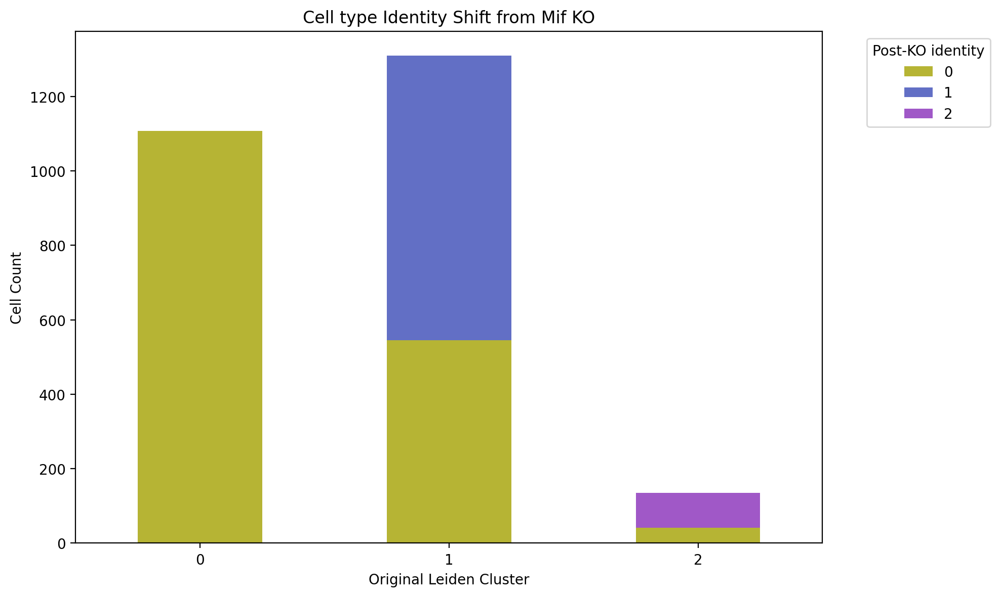

In [42]:
import pandas as pd
import matplotlib.pyplot as plt

df = adata.obs[['leiden', 'transition']].copy()
df['leiden'] = pd.Categorical(df['leiden'], ordered=True, categories=sorted(df['leiden'].unique(), key=lambda x: int(x)))
counts = df.groupby(['leiden', 'transition']).size().unstack(fill_value=0)

counts.plot(kind='bar', stacked=True, figsize=(10, 6), color=[color_dict[label] for label in counts.columns])
plt.xlabel('Original Leiden Cluster')
plt.ylabel('Cell Count')
plt.title('Cell type Identity Shift from Mif KO')

plt.xticks(rotation=0)

plt.legend(title='Post-KO identity', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


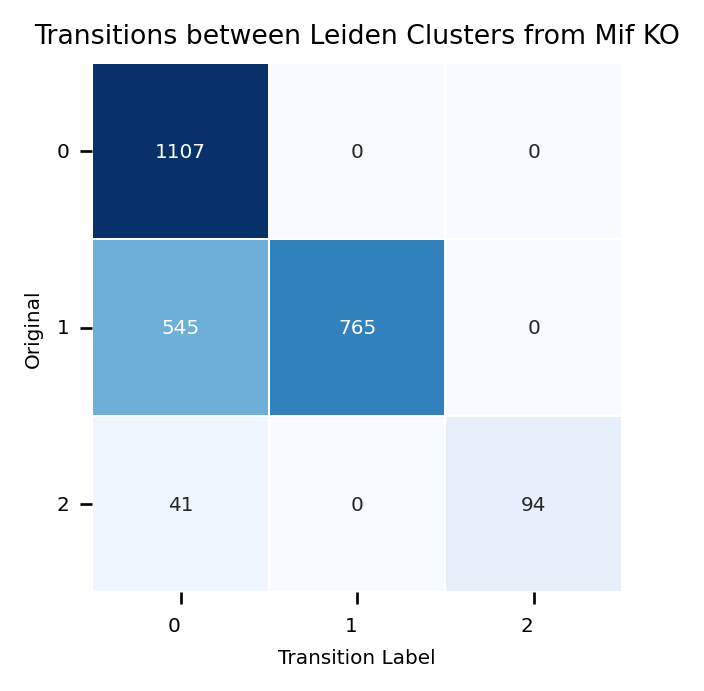

In [45]:
plt.figure(figsize=(3,3), dpi=120)

sns.heatmap(
    counts,
    annot=True,
    fmt='d',  # integer formatting
    cmap='Blues',  # nice clean color palette
    linewidths=0.5,
    linecolor='white',
    cbar=False,
    square=True,
    annot_kws={"size": 6}
)

plt.title("Transitions between Leiden Clusters from Mif KO", fontsize=8)
plt.xlabel("Transition Label", fontsize=6)
plt.ylabel("Original", fontsize=6)
plt.xticks(rotation=0, ha='right', fontsize=6)
plt.yticks(rotation=0, fontsize=6)

plt.savefig('figures/mouse_kidney_visium_MifKO_transitions.svg', format='svg')
plt.tight_layout()
plt.show()


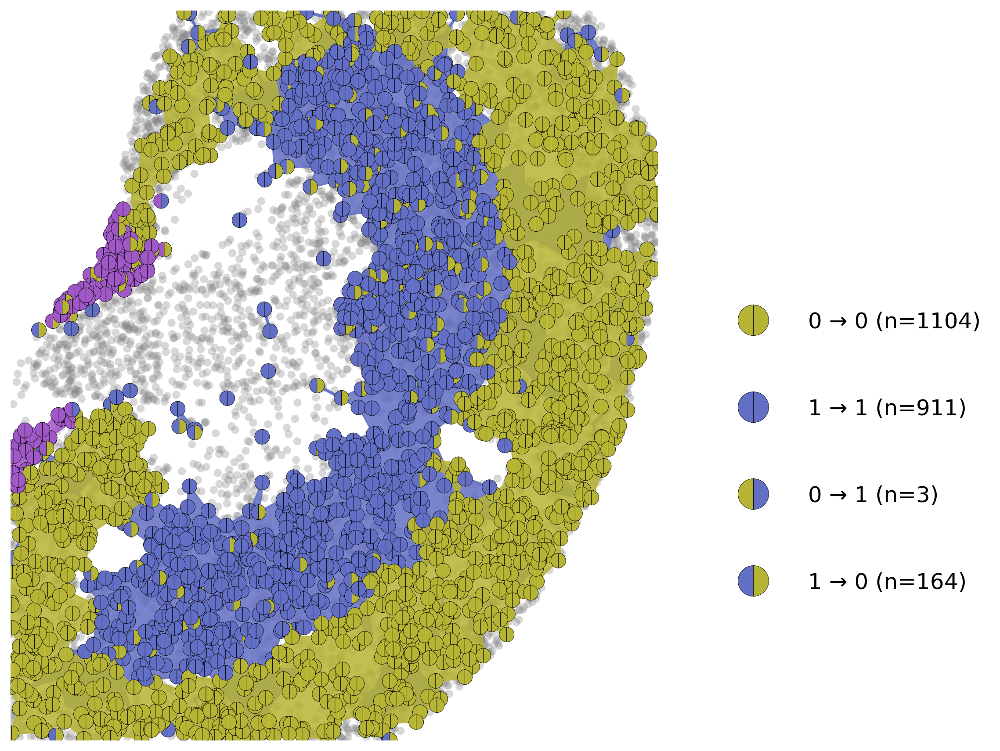

In [218]:
# # Custom handler for wedge pairs in legend
# class WedgePairHandler:
#     def __init__(self, rotation=0):
#         self.rotation = rotation
        
#     def legend_artist(self, legend, orig_handle, fontsize, handlebox):
#         x0, y0 = handlebox.xdescent, handlebox.ydescent
#         width, height = handlebox.width, handlebox.height
#         r = min(width, height) * 1
#         center = (x0 + width/2, y0 + height/2)
        
#         # Create left and right wedges with rotation
#         wedge1 = matplotlib.patches.Wedge(
#             center=center,
#             r=r,
#             theta1=90 + self.rotation, theta2=270 + self.rotation,
#             facecolor=orig_handle[0].get_facecolor(),
#             edgecolor='black',
#             linewidth=0.25,
#             transform=handlebox.get_transform()
#         )
        
#         wedge2 = matplotlib.patches.Wedge(
#             center=center,
#             r=r,
#             theta1=-90 + self.rotation, theta2=90 + self.rotation,
#             facecolor=orig_handle[1].get_facecolor(),
#             edgecolor='black', 
#             linewidth=0.25,
#             transform=handlebox.get_transform()
#         )
        
#         handlebox.add_artist(wedge1)
#         handlebox.add_artist(wedge2)
#         return [wedge1, wedge2]

# fig, ax = plt.subplots(figsize=(20, 9), dpi=120)
# data = xy.join(adata.obs)
# source_data = data[data.leiden == source_ct]
# transition_data = data.loc[source_cells]

# scatter = sns.scatterplot(
#     # data=xy.join(adata.obs),
#     data = test_adata.obs,
#     x='x', y='y',
#     # hue='banksy_celltypes', 
#     color='grey',
#     s=30,
#     alpha=0.3,
#     edgecolor='none',
#     # palette=color_dict,
#     ax=ax,
# )

# zone_alpha = 0.85
# area_thresh = 400

# for geom in alpha_shape_1.geoms:
#     if geom.area > area_thresh:
#         ax.fill(
#             geom.exterior.xy[0], 
#             geom.exterior.xy[1], 
#             color=color_dict['1'], alpha=zone_alpha)
        
# for geom in alpha_shape_0.geoms:
#     if geom.area > area_thresh:
#         ax.fill(
#             geom.exterior.xy[0], 
#             geom.exterior.xy[1], 
#             color=color_dict['0'], alpha=zone_alpha)
    
# for geom in alpha_shape_2.geoms:
#     if geom.area > area_thresh:
#         ax.fill(
#             geom.exterior.xy[0], 
#             geom.exterior.xy[1], 
#             color=color_dict['2'], alpha=zone_alpha)

# exclude_points = set()
# alpha_shape_4 = alpha_shape_0.intersection(alpha_shape_1)

# for geom in alpha_shape_4.geoms:
#      for idx, row in xy.iterrows(): 
#         point = row[['x', 'y']].values 
#         if geom.contains(Point(point)):  
#             exclude_points.update({idx}) 


# radius = 250
# for idx, row in data.iterrows():

#     # do not plot if they are in overlapping boundaries
#     if row.leiden == '1' and idx in exclude_points:
#         continue

#     if idx in source_cells:
#         angle = 0
#         circle1 = matplotlib.patches.Wedge((row.x, row.y), radius, 90+angle, 270+angle,
#                                          facecolor=color_dict[row.leiden],
#                                          alpha=1,
#                                          edgecolor='black', linewidth=0.25)
#         circle2 = matplotlib.patches.Wedge((row.x, row.y), radius, -90+angle, 90+angle,
#                                          facecolor=color_dict[row.transition],
#                                          alpha=1,
#                                          edgecolor='black', linewidth=0.25)
#         ax.add_patch(circle1)
#         ax.add_patch(circle2)


# # Collect all unique transition types from transition_data
# unique_transitions = transition_data['transition'].unique()

# # Create legend elements for each transition type
# legend_elements = []
# labels = []

# # for transition in ['0', '1', '2']:
# for transition, source_ct in [('0', '0'), ('1', '1'), ('1', '0'), ('0', '1')]:
#     # Count number of transitions for this type
#     if source_ct == '1':
#         tmp = transition_data[(transition_data['transition'] == transition) & (transition_data['leiden'] == source_ct)]
#         tmp = tmp[~tmp.index.isin(exclude_points)]
#         n_transitions = len(tmp)
#     else:
#         n_transitions = len(transition_data[(transition_data['transition'] == transition) & (transition_data['leiden'] == source_ct)])
    
#     wedge_source = matplotlib.patches.Wedge((0,0), radius, 0, 0,
#                                         facecolor=color_dict[source_ct])
#     wedge_transition = matplotlib.patches.Wedge((0,0), radius, 0, 0,
#                                             facecolor=color_dict[transition])
#     legend_elements.append((wedge_source, wedge_transition))
#     labels.append(f"{source_ct} → {transition} (n={n_transitions})")

# transition_legend = ax.legend(legend_elements, labels, 
#                             handler_map={tuple: WedgePairHandler(rotation=0)},
#                             bbox_to_anchor=(1.1, 0.6), 
#                             # loc='center right', 
#                             borderaxespad=0.,
#                             fontsize=15,
#                             markerscale=5,
#                             labelspacing=3,
#                             handletextpad=1.5, 
#                             frameon=False,
#                             title="")

# ax.set_frame_on(False)
# ax.set_xticks([])
# ax.set_yticks([])
# ax.set_xlabel('')
# ax.set_ylabel('')
# ax.set_aspect('equal')
# ax.set_xlim(data.x.min() - 10, data.x.max() + 10)
# ax.set_ylim(data.y.min() - 10, data.y.max() + 10)

# plt.savefig(f'figures/mouse_kidney_visium_MifKO.png')

### Non-mac cells

In [51]:
adata_ = adata[(adata.obs['cell_type'] != 'Myeloid')]
adata_.obs['cell_type'].value_counts()

Series([], Name: count, dtype: int64)

In [52]:
adata.obs['cell_type'].value_counts()

cell_type
Myeloid    2552
Name: count, dtype: int64

In [ ]:
# sc.pp.neighbors(adata_, use_rep='X_umap')
sc.pp.neighbors(adata_, use_rep='X_pca')
sc.tl.leiden(adata_, key_added='leiden', resolution=0.05)

# color_dict = {i: color for i, color in zip(adata_.obs['leiden'].unique(), colors[::-1])}
color_dict = {
    '1': '#ffbdbd',
    '0': '#fca138',
    '2': '#fcd400',
    '-1': '#ffffff'}

plt.scatter(
    adata.obsm['spatial'][:, 0], adata.obsm['spatial'][:, 1],
    c='lightgray', s=10, alpha=0.3,
    edgecolor='black', linewidth=0.1
)
for ct in adata_.obs['leiden'].unique():
    mask = adata_.obs['leiden'] == ct
    plt.scatter(
        adata_.obsm['spatial'][mask, 0], adata_.obsm['spatial'][mask, 1],
        c=color_dict[ct], s=10, alpha=0.9, label=ct,
        edgecolor='black', linewidth=0.1
    )
plt.gca().set_axis_off()
plt.gca().set_aspect('equal')
plt.legend()

plt.show()


InvalidParameterError: The 'n_neighbors' parameter of KNeighborsTransformer must be an int in the range [1, inf) or None. Got -1 instead.

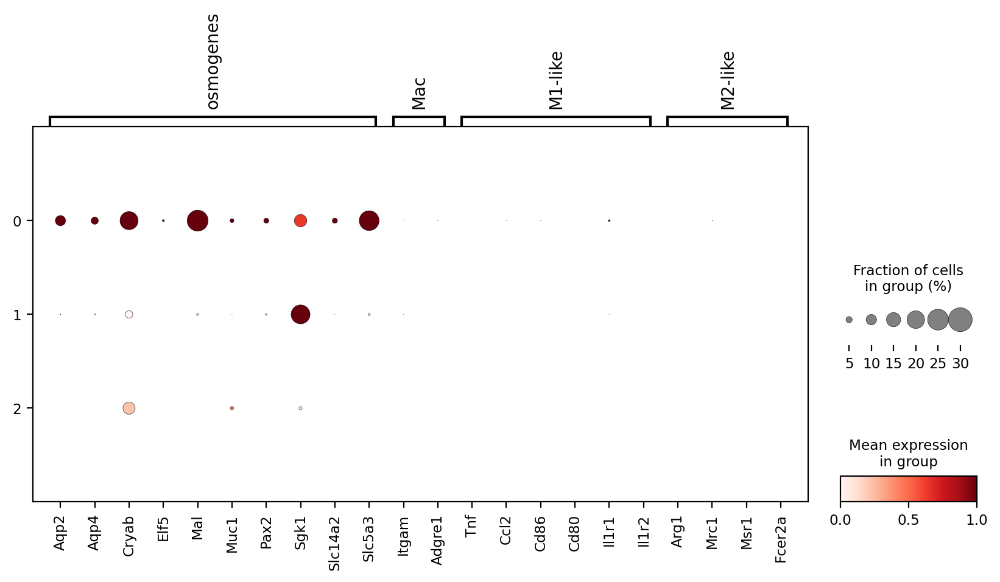

In [21]:
marker_dict = {
    'osmogenes': ['Aqp2', 'Aqp4', 'Cryab', 'Elf5', 'Mal', 'Muc1',
        'Pax2', 'Sgk1', 'Slc14a2', 'Slc5a3'],
    'Mac': ['Itgam', 'Adgre1'],
    'M1-like': ["Tnf", 'Ccl2', 'Cd86', 'Cd80', 'Il1r1', 'Il1r2'],
    'M2-like': ['Arg1', 'Mrc1', 'Msr1', 'Fcer2a']
}


marker_dict = {k: [x for x in v if x in adata.var_names] for k,v in marker_dict.items()}
sc.pl.dotplot(
    adata_,
    marker_dict,
    # layer='imputed_count', 
    layer='normalized_count',  
    # groupby='banksy_cluster',
    # groupby='ct3',
    groupby='leiden', 
    dendrogram=False,
    standard_scale='var',
    figsize=(10, 4), 
    # title='Macrophage Markers in mouse_kidney_13',
)


In [22]:
# adata_.obs['banksy_cluster'] = adata_.obs['banksy_cluster'].astype(int)

chart_ = Cartography(adata_, color_dict)


In [23]:
delta_X = (chart_.adata.to_df(layer='Mif') - chart_.unperturbed_expression).values
gene_mtx = chart_.unperturbed_expression.values
gene_mtx.shape, delta_X.shape

((7342, 3058), (7342, 3058))

In [24]:
corr = chart_.compute_perturbation_corr(gene_mtx, delta_X)
corr.shape

(7342, 7342)

In [25]:
## PLOT

import alphashape
from matplotlib.legend_handler import HandlerTuple
import matplotlib
import seaborn as sns 
from shapely.geometry import Point

In [26]:
adata = adata_
chart = chart_

In [27]:
chart.get_transition_annot(
    corr, allowed_fates=['0', '1', '2'], thresh=0.0002, annot='leiden')
adata.obs['transition'] = chart.adata.obs['transition']

source ct 0 Counter({'0': 4183, '1': 520, '2': 6}) 0.0002730854009152471
source ct 1 Counter({'1': 2584}) 0.00034447298626682317
source ct 2 Counter({'2': 47, '1': 2}) 0.0003353996158354702


In [28]:
source_cells = adata.obs.index

In [29]:
xy = pd.DataFrame(adata.obsm['spatial'], index=adata.obs.index, columns=['x', 'y'])

In [30]:
ct_points_wt, ct_points_ko = chart.make_celltype_dict(annot='leiden')

In [31]:
ref_adata.obs['x'] = ref_adata.obsm['spatial'][:, 0]
ref_adata.obs['y'] = ref_adata.obsm['spatial'][:, 1]

In [32]:
source_cells = adata.obs.index

In [55]:
alpha_shape_0 = alphashape.alphashape(ct_points_wt['0'], alpha=0.004)
alpha_shape_1 = alphashape.alphashape(ct_points_wt['1'], alpha=0.003)
alpha_shape_2 = alphashape.alphashape(ct_points_wt['2'], alpha=0.003)

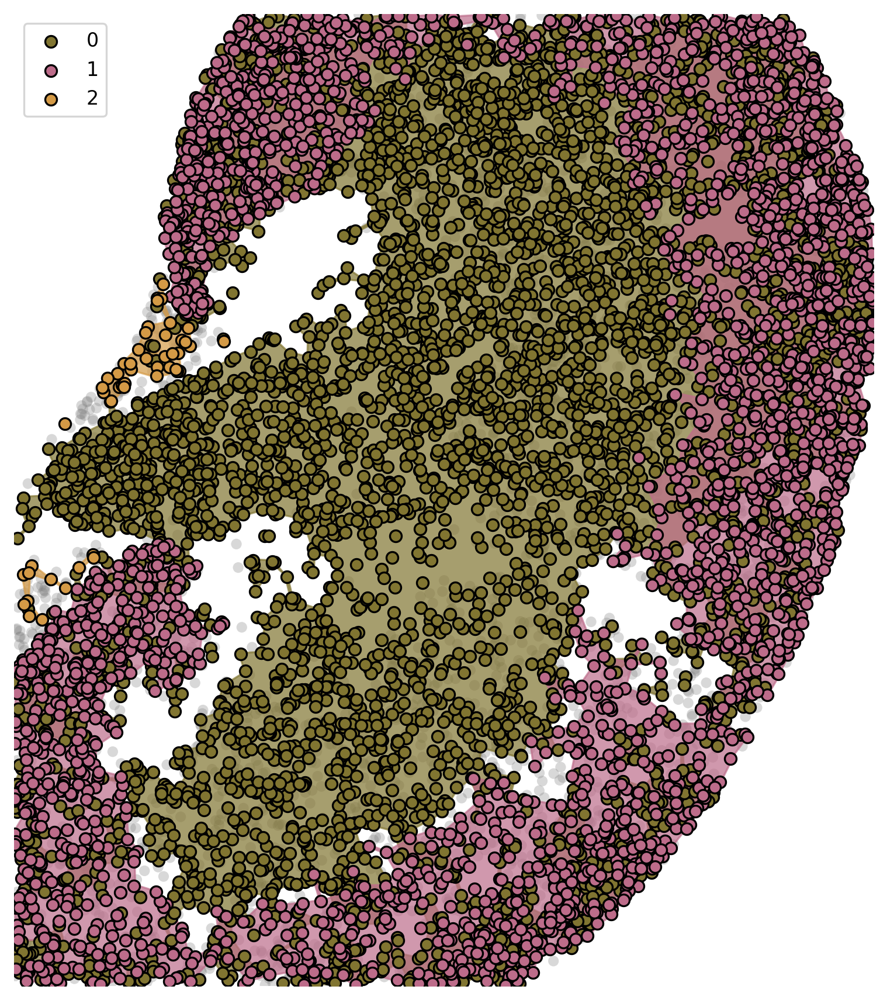

In [56]:
fig, ax = plt.subplots(figsize=(20, 9), dpi=120)
data = xy.join(adata.obs)
transition_data = data.loc[source_cells]

scatter = sns.scatterplot(
    # data=xy.join(adata.obs),
    data = test_adata.obs,
    x='x', y='y',
    # hue='banksy_celltypes', 
    color='grey',
    s=30,
    alpha=0.3,
    edgecolor='none',
    # palette=color_dict,
    ax=ax,
)

zone_alpha = 0.7
area_thresh = 400

for geom in alpha_shape_0.geoms:
    if geom.area > area_thresh:
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=color_dict['0'], alpha=zone_alpha)

for geom in alpha_shape_1.geoms:
    if geom.area > area_thresh:
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=color_dict['1'], alpha=zone_alpha)
        
for geom in alpha_shape_2.geoms:
    if geom.area > area_thresh:
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=color_dict['2'], alpha=zone_alpha)

for ct in adata.obs['leiden'].unique():
    ax.scatter(
        adata[adata.obs['leiden'] == ct].obsm['spatial'][:, 0],
        adata[adata.obs['leiden'] == ct].obsm['spatial'][:, 1],
        c=color_dict[ct], alpha=1, edgecolor='black', linewidth=1, label=ct
    )

handles, labels = ax.get_legend_handles_labels()
sorted_handles_labels = sorted(zip(handles, labels), key=lambda x: int(x[1]))
sorted_handles, sorted_labels = zip(*sorted_handles_labels)
ax.legend(sorted_handles, sorted_labels)

ax.set_frame_on(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_xlim(data.x.min() - 10, data.x.max() + 10)
ax.set_ylim(data.y.min() - 10, data.y.max() + 10)

plt.savefig(f'figures/mouse_kidney_visium_MifKO_preKO_nonMyeloid.svg', format='svg')

In [57]:
alpha_shape_0 = alphashape.alphashape(ct_points_ko['0'], alpha=0.004)
alpha_shape_1 = alphashape.alphashape(ct_points_ko['1'], alpha=0.003)
alpha_shape_2 = alphashape.alphashape(ct_points_ko['2'], alpha=0.003)

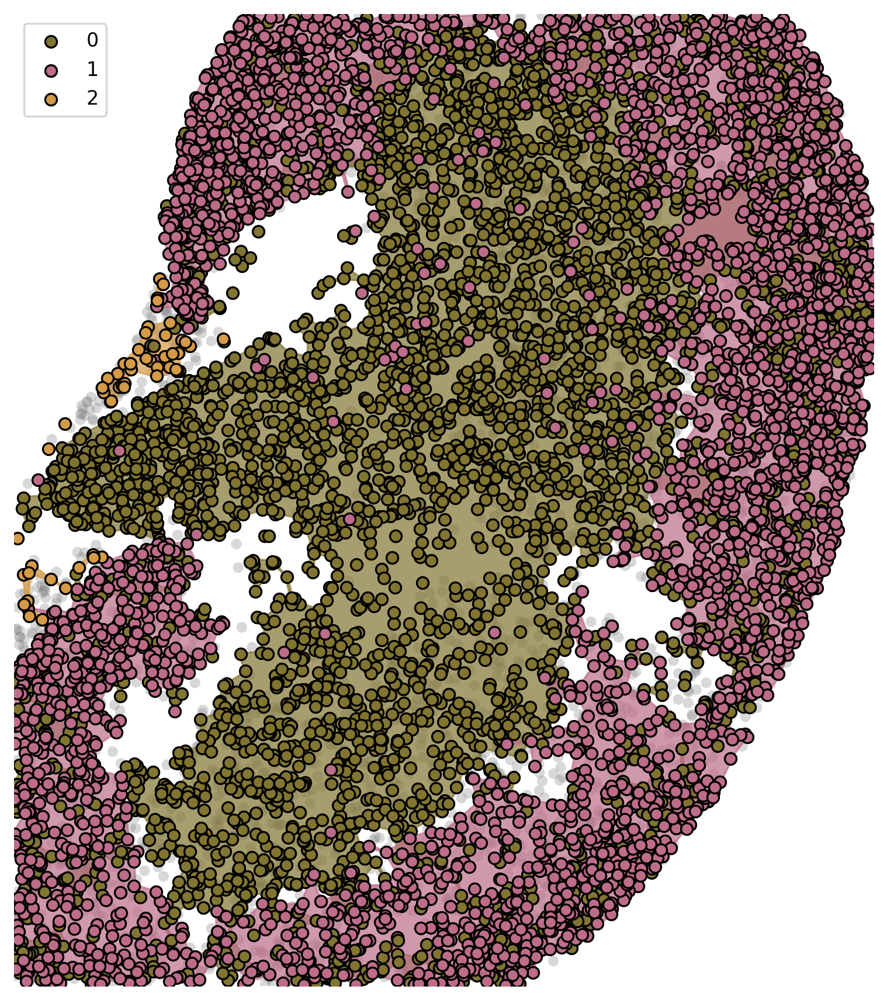

In [58]:
fig, ax = plt.subplots(figsize=(20, 9), dpi=120)
data = xy.join(adata.obs)
transition_data = data.loc[source_cells]

scatter = sns.scatterplot(
    # data=xy.join(adata.obs),
    data = test_adata.obs,
    x='x', y='y',
    # hue='banksy_celltypes', 
    color='grey',
    s=30,
    alpha=0.3,
    edgecolor='none',
    # palette=color_dict,
    ax=ax,
)

zone_alpha = 0.7
area_thresh = 400

for geom in alpha_shape_0.geoms:
    if geom.area > area_thresh:
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=color_dict['0'], alpha=zone_alpha)
    

for geom in alpha_shape_1.geoms:
    if geom.area > area_thresh:
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=color_dict['1'], alpha=zone_alpha)
        
    
for geom in alpha_shape_2.geoms:
    if geom.area > area_thresh:
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=color_dict['2'], alpha=zone_alpha)

for ct in adata.obs['transition'].unique():
    ax.scatter(
        adata[adata.obs['transition'] == ct].obsm['spatial'][:, 0],
        adata[adata.obs['transition'] == ct].obsm['spatial'][:, 1],
        c=color_dict[ct], alpha=1, edgecolor='black', linewidth=1,
        label=ct
    )

handles, labels = ax.get_legend_handles_labels()
sorted_handles_labels = sorted(zip(handles, labels), key=lambda x: int(x[1]))
sorted_handles, sorted_labels = zip(*sorted_handles_labels)
ax.legend(sorted_handles, sorted_labels)

ax.set_frame_on(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_xlim(data.x.min() - 10, data.x.max() + 10)
ax.set_ylim(data.y.min() - 10, data.y.max() + 10)

plt.savefig(f'figures/mouse_kidney_visium_MifKO_postKO_nonMyeloid.svg', format='svg')

In [60]:
df = adata.obs[['leiden', 'transition']].copy()
df['leiden'] = pd.Categorical(df['leiden'], ordered=True, categories=sorted(df['leiden'].unique(), key=lambda x: int(x)))
counts = df.groupby(['leiden', 'transition']).size().unstack(fill_value=0)


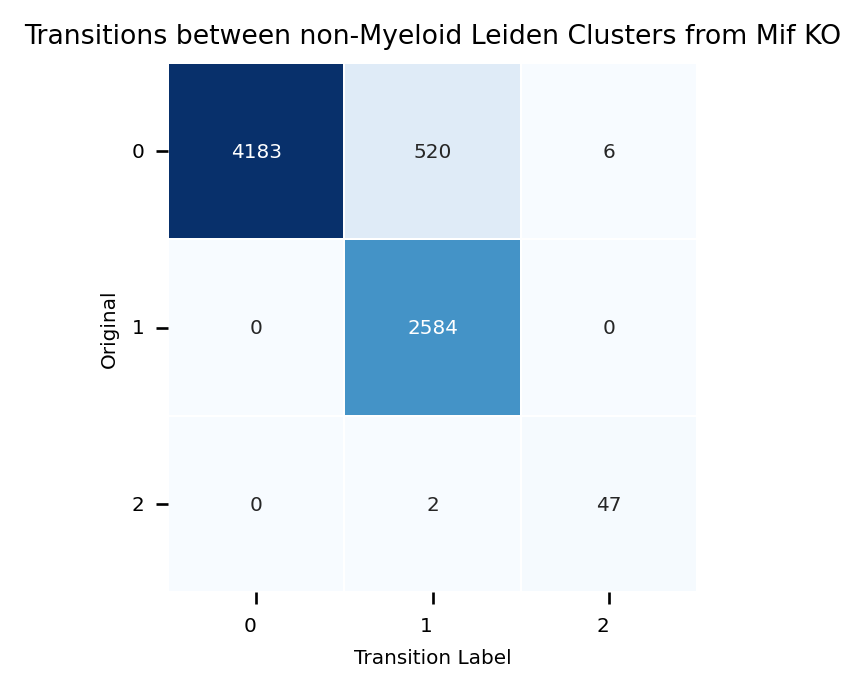

In [62]:
plt.figure(figsize=(3,3), dpi=120)

sns.heatmap(
    counts,
    annot=True,
    fmt='d',  # integer formatting
    cmap='Blues',  # nice clean color palette
    linewidths=0.5,
    linecolor='white',
    cbar=False,
    square=True,
    annot_kws={"size": 6}
)

plt.title("Transitions between non-Myeloid Leiden Clusters from Mif KO", fontsize=8)
plt.xlabel("Transition Label", fontsize=6)
plt.ylabel("Original", fontsize=6)
plt.xticks(rotation=0, ha='right', fontsize=6)
plt.yticks(rotation=0, fontsize=6)

plt.savefig('figures/mouse_kidney_visium_MifKO_transitions_nonMyeloid.svg', format='svg')
plt.tight_layout()
plt.show()
